# **6 Transfer Model**

### I. Team-Members
- Felix Gaber, 20221385
- Felix Gayer, 20220320
- David Halder, 20220632
- Lukas Stark, 20220626
- Rita Soares, 20220616


### II. Link to the Dataset
https://drive.google.com/drive/folders/1D8Hd49L0OLlSz2oCuuctfCKDcR8HK_c4?usp=share_link



### III. Summary of the notebook



Welcome to this Jupyter Notebook on binary image classification with a pre-trained network approach. In this notebook, we will explore a pre-trained model to classify images of tires as damaged or not damaged. We will use a pre-trained model that was trained on a large-scale image-classification task and adapt it to our specific problem. This way, we can leverage the learned feature maps of the pre-trained model without having to train a large model from scratch on our dataset.

Our dataset consists of images of tires with normal tire profile and images of tires with additional cracks or other damages. Our goal is to detect the anomalies in the images and classify them as damaged or not damaged. This is a binary classification task, which means we have two possible classes for each image.

There are multiple pre-trained models available for image classification, such as VGG16, ResNet50 etc. (see Keras, 2023) [1] However, these models were trained on different datasets and tasks than ours, so we need to customize them to fit our problem. We will do this in two steps (see Tensorflow, 2023) [2]:

- `Feature extraction`: We will use the pre-trained model as a fixed feature extractor and add a customized head (a classifier layer) on top of it. The pre-trained model will take the input images and output a feature vector for each image. The classifier layer will take the feature vector and output a probability for each class. In this step, we will only train the classifier layer and keep the pre-trained model frozen. This way, we can use the generic features learned by the pre-trained model and fine-tune them to our specific task.
- `Fine-tuning`: We will unfreeze some of the top layers of the pre-trained model and jointly train them with the classifier layer. This way, we can further adjust the higher-level features of the pre-trained model to our specific task and improve the performance of our model.

In this notebook, we will use the data augmentation techniques that we applied in the previous notebook to increase the size and diversity of our dataset. We will also use some other techniques such as dropout, learning rate decay, etc. to improve the generalization and convergence of our model.

### References 


1. Keras (2023): Keras documentation: Applications. Available online at https://keras.io/api/applications, checked on 8/4/2023

2. Tensorflow (2023): Tensorflow documentation: Transfer Learning. Available online at https://www.tensorflow.org/tutorials/images/transfer_learning, checked on 8/4/2023

3. Keras (2023): Keras documentation: ResNet50. Available online at https://keras.io/api/applications/resnet/#resnet50-function, checked on 8/4/2023

4. Keras (2023): Keras documentation: VGG19. Available online at https://keras.io/api/applications/vgg/#vgg19-function, checked on 8/4/2023

5. Karen Simonyan, Andrew Zisserman (2014): Very Deep Convolutional Networks for Large-Scale Image Recognition. Available online at https://arxiv.org/abs/1409.1556#, checked on 8/4/2023


6. Kaiming He, Xiangyu Zhang, Shaoqing Ren, Jian Sun (2015): Deep Residual Learning for Image Recognition. Available online at https://arxiv.org/abs/1512.03385, checked on 8/4/2023

7. Keras (2023): Keras documentation: EarlyStopping. Available online at https://keras.io/api/callbacks/early_stopping/, checked on 8/4/2023

8. Keras (2023): Keras documentation: ModelCheckpoint. Available online at https://keras.io/api/callbacks/model_checkpoint/, checked on 8/4/2023

9. Ronen Fluss, David Faraggi, Benjamin Reiser (2005): Estimation of the Youden Index and its associated cutoff point. Available online at https://doi.org/10.1002/bimj.200410135, checked on 8/4/2023






## **6.1 Setup**

### **6.1.1 Mount Personal GDrive**

In [1]:
from google.colab import drive
drive.mount('/content/drive')

gdrive = True

Mounted at /content/drive


### **6.1.2 Import librarys**

In [2]:
import tensorflow as tf
import os
import numpy as np
from tensorflow.keras import Sequential, layers, optimizers, losses, metrics, applications, preprocessing, callbacks, models, Model
import matplotlib.pyplot as plt
import datetime
import cv2

### **6.1.3 Hyperparameter setup**

In this cell, we define the directory paths and hyperparameter settings that we will use for testing different models and architectures. This way, we can easily control and change the settings without modifying the code in other cells. We also experiment with different hyperparameter values to find the best performance for our task.

Some of the hyperparameters that we tune are batch_size, dropout_rate, initial_learning_rate, fine_tune_learning_rate, initial_epochs and fine_tune_epochs. These affect the speed and accuracy of the training process and the final results. We also need to specify some hyperparameters that are required by the transfer model, such as color_mode (rgb) and image_size (224, 224).*(see Keras, 2023)[3][4]*

The following cell shows our optimal settings we tested an found out - for the model that we will build in the next cells.

In [3]:
path = '/content/drive/MyDrive/DeepLearningProject/03 Project/Data/'
main_folder, training_folder, testing_folder = "Tire Textures/", "training_data/", "testing_data/"

path_aug = '/content/drive/MyDrive/DeepLearningProject/03 Project/augmented_data/'
main_folder_aug, training_folder_aug, val_folder_aug= "Tire Textures/", "training_data/", "validation_data/"

image_size=(224, 224)                                     # 224x224 is mentioned as good format for the pretrained models in the model doctumentation
crop_to_aspect_ratio=True
color_mode='rgb'                                          # rgb is required for the pre-trained models 
batch_size=32                                             # we tested diffrent batch sizes between 8 and 128 (with power of 2)
label_mode="binary"
shuffle=True
seed=0


dropout_rate = 0.4                                        # we tested diffrent dropout rates between 0.2 and 0.8
initial_learning_rate = 0.0001                            # we tested diffrent learning rates between 0.0001 and 0.01
fine_tune_learning_rate = initial_learning_rate/10        # has to be smaler compared to the initial learning rate to avoid overfitting
initial_epochs = 7                                        # early stopping is implemented, with the pre-trained model the validation loss normaly stops decreasing at 7-15 epochs depending on the model
fine_tune_epochs = 3



### **6.1.4 Import the Data**







In [ ]:
ds_train = preprocessing.image_dataset_from_directory(path_aug + main_folder_aug + training_folder_aug, 
                                                image_size=image_size,
                                                crop_to_aspect_ratio=crop_to_aspect_ratio,
                                                color_mode=color_mode,
                                                batch_size=batch_size,
                                                label_mode=label_mode,
                                                shuffle=shuffle,
                                                seed=seed)

ds_val = preprocessing.image_dataset_from_directory(path_aug + main_folder_aug + val_folder_aug, 
                                                image_size=image_size,
                                                crop_to_aspect_ratio=crop_to_aspect_ratio,
                                                color_mode=color_mode,
                                                batch_size=batch_size,
                                                label_mode=label_mode,
                                                shuffle=shuffle,
                                                seed=seed)

ds_test = preprocessing.image_dataset_from_directory(path + main_folder + testing_folder, 
                                                image_size=image_size,
                                                crop_to_aspect_ratio=crop_to_aspect_ratio,
                                                color_mode=color_mode,
                                                batch_size=batch_size,
                                                label_mode=label_mode,                                     
                                                shuffle=shuffle,
                                                seed=seed)


Found 3197 files belonging to 2 classes.
Found 233 files belonging to 2 classes.
Found 335 files belonging to 2 classes.


In [ ]:
def class_dist_check(ds_train, ds_val, ds_test):
  class_names= ds_train.class_names

  # Count the number of images in each class for the training data
  num_images_train = []
  for class_name in class_names:
      num_images = 0
      for images, labels in ds_train:
          num_images += tf.math.count_nonzero(labels == class_names.index(class_name)).numpy()
      num_images_train.append(num_images)

  # Count the number of images in each class for the validation data
  num_images_valid = []
  for class_name in class_names:
      num_images = 0
      for images, labels in ds_val:
          num_images += tf.math.count_nonzero(labels == class_names.index(class_name)).numpy()
      num_images_valid.append(num_images)

  
  num_images_test = []
  for class_name in class_names:
      num_images = 0
      for images, labels in ds_test:
          num_images += tf.math.count_nonzero(labels == class_names.index(class_name)).numpy()
      num_images_test.append(num_images)



  # Print out the results
  print('Training set:')
  for i in range(len(class_names)):
      print(f'{class_names[i]}: {num_images_train[i]}')

  print('\nValidation set:')
  for i in range(len(class_names)):
      print(f'{class_names[i]}: {num_images_valid[i]}')

  print('\nTest set:')
  for i in range(len(class_names)):
      print(f'{class_names[i]}: {num_images_test[i]}')

class_dist_check(ds_train, ds_val, ds_test)

Training set:
cracked: 1595
normal: 1602

Validation set:
cracked: 108
normal: 125

Test set:
cracked: 210
normal: 125


In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

ds_train = ds_train.prefetch(buffer_size=AUTOTUNE)
ds_val = ds_val.prefetch(buffer_size=AUTOTUNE)
ds_test = ds_test.prefetch(buffer_size=AUTOTUNE)

## **6.2 Load the base models from the pre-trained CNN**
In this notebook, we compare the performance of two different models for binary image classification and anomaly detection on tire images. We selected the models from the Keras Applications library [2], which provides pre-trained models for various computer vision tasks. The models we chose are VGG19 and ResNet50, which have different base model architectures and have been shown to achieve good results on similar projects. 

VGG19 is a convolutional neural network with 19 layers, while ResNet50 is a residual network with 50 layers. ResNet50 is "*8x deeper than VGG nets but still having lower complexity than VGG19 nets" (HeDeep, 2015)* [6] We wanted to see if the choice of base model architecture makes a difference for our tire task. *(see Keras, 2023)*[3][4]

### **6.2.1 VGG 19 model** 

The VGG 19 model is a deep convolutional neural network. The model consists of 19 layers, including 16 convolutional layers and 3 fully connected layers. The convolutional layers have 3x3 filters with a stride of 1 and a padding of 1, which preserves the spatial dimensions of the input. The convolutional layers are followed by max pooling layers with a 2x2 window and a stride of 2, which reduces the spatial dimensions by half. The number of filters in the convolutional layers increases from 64 to 512 as the depth of the network increases. The fully connected layers have 4096 neurons each, except for the last one which has 1000 neurons for the classification task. The model uses ReLU activation function for all the layers except for the last one, which uses softmax activation function. The model was trained on the ImageNet dataset and achieved state-of-the-art results on several image recognition tasks.*(see Karen Simonyan, Andrew Zisserman, 2014) [5]*

In [ ]:
base_model_name_vgg = 'vgg'

vgg_model = applications.VGG19(
                        weights='imagenet', 
                         include_top=False, 
                         input_shape=(*image_size, 3),
                         pooling = 'avg')               # we add a GlobalAveragePooling2D layer after the last block
                                                        # we also tried it with a GlobalAveragePooling

vgg_model.save_weights(base_model_name_vgg)


def preprocess_vgg(images, labels):
  return applications.vgg19.preprocess_input(images), labels

ds_train_vgg = (ds_train.map(preprocess_vgg))
ds_val_vgg = (ds_val.map(preprocess_vgg))
ds_test_vgg = (ds_test.map(preprocess_vgg))


vgg_model.summary()

80134624/80134624 [==============================] - 0s 0us/step
Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                              

### **6.2.2 ResNet50 model**

The resnet50 model is a deep neural network that consists of 50 convolutional layers. The main feature of the resnet50 model is the use of residual connections, which are shortcuts that skip one or more layers and add the output of the previous layer to the input of the next layer. This helps to avoid the problem of vanishing gradients and improve the accuracy of the model. The resnet50 model has five stages, each with a different number of convolutional blocks. The first stage has one convolutional block, the second stage has three blocks, the third stage has four blocks, the fourth stage has six blocks, and the fifth stage has three blocks. Each block has three convolutional layers with batch normalization and ReLU activation, followed by a residual connection. *(see HeDeep, 2015)* [6]

In [ ]:
base_model_name_resnet = "resnet"

resnet_model = applications.ResNet50(
                                    weights='imagenet', 
                                    include_top=False, 
                                    input_shape=(*image_size, 3),
                                    pooling = 'avg')                  # we add a GlobalAveragePooling2D layer after the last block
                                                                      # we also tried it with a GlobalAveragePooling

resnet_model.save_weights(base_model_name_resnet)


def preprocess_resnet(images, labels):
  return applications.resnet50.preprocess_input(images), labels

ds_train_resnet = (ds_train.map(preprocess_resnet))
ds_val_resnet = (ds_val.map(preprocess_resnet))
ds_test_resnet = (ds_test.map(preprocess_resnet))

resnet_model.summary()

94765736/94765736 [==============================] - 0s 0us/step
Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_2[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                          

## **6.3 Model training**

### **6.3.1 Functions for model head adaption, finetuning and plotting**


In this cell, we define some functions to adapt the base model head, fine-tune the last layers of the model, and plot the accuracy and loss curves for the training and validation data.

To adapt the base model head, we set the include_top parameter to False when importing the models. This way, we exclude the original output layer of the models that have 1000 classes. Instead, we add our own output layer for binary classification.

We use two different approaches for the output layer. The first one is a basic one, where we use a GlobalAveragePooling layer followed by a dense layer with one node and a sigmoid activation function. The second one is more complex, where we add some additional dense and dropout layers between the GlobalAveragePooling layer and the output layer.

We experimented with different architectures and hyperparameters for the second approach. We tried different pooling methods (such as MaxPooling and AveragePooling), different numbers of dense layers and nodes per layer, different dropout rates and with or without BatchNormalizations.

In [ ]:
def model_adaption(base_model, base_model_name, version=1):
  
  base_model.trainable = False

  model = Sequential(name=base_model_name)
  model.add(base_model)
  if version == 2:
    model.add(layers.Flatten())
    model.add(layers.Dense(264, activation='relu'))
    model.add(layers.BatchNormalization())
    model.add(layers.Dropout(dropout_rate))
    model.add(layers.Dense(64, activation='relu'))
    model.add(layers.BatchNormalization())
    model.add(layers.Dropout(dropout_rate))
  model.add(layers.Dense(1, activation='sigmoid'))     
  return model


def unfreeze_finetune_model(base_model):
  base_model.trainable = True
  fine_tune_at = len(base_model.layers) - 10

  # Freeze all the layers before the `fine_tune_at` layer
  for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

  return base_model 




def show_plot(acc, val_acc, loss, val_loss):
  plt.figure(figsize=(8, 8))
  plt.subplot(2, 1, 1)
  plt.plot(acc, label='Training Accuracy')
  plt.plot(val_acc, label='Validation Accuracy')
  plt.ylim([0.5, 1])
  plt.plot([initial_epochs-1,initial_epochs-1],
            plt.ylim(), label='Start Fine Tuning')
  plt.legend(loc='lower right')
  plt.title('Training and Validation Accuracy')

  plt.subplot(2, 1, 2)
  plt.plot(loss, label='Training Loss')
  plt.plot(val_loss, label='Validation Loss')
  plt.ylim([0, 1.0])
  plt.plot([initial_epochs-1,initial_epochs-1],
          plt.ylim(), label='Start Fine Tuning')
  plt.legend(loc='upper right')
  plt.title('Training and Validation Loss')
  plt.xlabel('epoch')
  plt.show()

### **6.3.2 Function for model training**

In this cell, we created the function to train the model - using the following steps:

- First, we setup the EarlyStopping (see Keras, 2023) [7] to avoid overfitting  and Model Checkpoints to save the best weights during training. (see Keras, 2023) [8] We also call the model adaption function to build the model as defined in the previous step. This function will attach the custom model head to the frozen base model and return the final model.
- Then, we compile the final model using an Adam optimizer and a BinaryCrossentropy loss function. We also show the summary of the model to see if the architecture is right and the trainable parameters are correct.
  - Here we tried diffrent optimizer next to Adam like Stochastic Gradient Descent and Adaptive Gradient Descend.
- After that, we calculate the initial loss and accuracy on the validation data to have a baseline value. 
- We then fit the model on the training data for a number of epochs and validate it on the validation data after each epoch.
- Finally, we evaluate the loss and accuracy of the validation and test data to see our improvement. The evaluation on test is impemented to see how mutch the gap is between validation and test. We realized trough the training that they perform diffrent. But **to optimize the model we don't use the test evaluation** in this step.

in the second part of the function, we will fine-tune the model using the following steps:

- First, we use our function unfreeze_finetune_model to unfreeze the last layers of the base model. This function will take the final model from the first part of the function and a number of layers to unfreeze as inputs and return an updated model.
- Next, we compile and fit the updated model again using a lower learning rate. 
- Then, we evaluate the updated model on the validation data for a third time. We also plot the learning curves to see how fine-tuning affected the performance. The green line in the plot shows the cut between the model head training and the fine-tuning.
- Finally, we load the weights from the best checkpoint and save the model as a file.


In [ ]:
def model_training(ds_train, ds_val, base_model, base_model_name, version=1, finetune=True, initial_epochs=initial_epochs, fine_tune_epochs=fine_tune_epochs ):
  
  # clear checkpoints and load base model weights 
  tf.keras.backend.clear_session()
  base_model.load_weights(base_model_name)
  !rm -rf ./content/checkpoint

  # checkpoint and early stopping setup
  checkpoint_dir = "content/checkpoint"
  model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
                              filepath=checkpoint_dir,
                              save_weights_only=True,
                              monitor='val_loss',
                              mode='min',
                              save_best_only=True)
  
  early_stopping = callbacks.EarlyStopping(
     monitor='val_loss',
     patience=3,
     verbose=0,
     mode='auto'
     )


  # Base model adaption & compiling 
  model = model_adaption(base_model, base_model_name, version)

  model.compile(optimizer=optimizers.experimental.Adam(learning_rate=initial_learning_rate),
                loss=losses.BinaryCrossentropy(), 
                metrics=['accuracy'])
  
  model.summary()

  # Initial validation loss & accuracy calculation 
  print('--- initial loss & accuracy -------------------------------------------')
  loss0, accuracy0 = model.evaluate(ds_val)
  print("initial loss: {:.2f}".format(loss0))
  print("initial accuracy: {:.2f}".format(accuracy0))


  # Base model head training
  print('--- fit model head ----------------------------------------------------')
  history = model.fit(ds_train,
                      epochs=initial_epochs,
                      validation_data=ds_val,
                      callbacks=[early_stopping, model_checkpoint_callback])
  
  # Save base model head training values to plot progress
  acc = history.history['accuracy'][:initial_epochs]
  val_acc = history.history['val_accuracy'][:initial_epochs]
  loss = history.history['loss'][:initial_epochs]
  val_loss = history.history['val_loss'][:initial_epochs]

  # validation loss & accuracy calculation with head training
  print('--- validation loss & accuracy with head  -------------------------------------------')
  loss1, accuracy1 = model.evaluate(ds_val)
  print("loss: {:.2f}".format(loss1))
  print("accuracy: {:.2f}".format(accuracy1))  

  # test loss & accuracy calculation with fine tuning
  print('--- test loss & accuracy with with head -------------------------------------------')
  loss4, accuracy4 = model.evaluate(ds_test)
  print("loss: {:.2f}".format(loss4))
  print("accuracy: {:.2f}".format(accuracy4)) 

  if finetune == True:
    # Fine tune the model - Unfreeze, compile & train the last layers of the base_model with the new head
    unfreeze_finetune_model(base_model)

    model.compile(loss=losses.BinaryCrossentropy(),
                  optimizer = optimizers.Adam(learning_rate=fine_tune_learning_rate),
                  metrics=['accuracy'])

    model.summary()

    print('--- fit unfreezed model -----------------------------------------------')
    history_fine = model.fit(ds_train,
                            epochs=initial_epochs + fine_tune_epochs,
                            initial_epoch=history.epoch[-1],
                            validation_data=ds_val,
                            callbacks=[early_stopping, model_checkpoint_callback])
    

    # Save fine tune model training values to plot progress
    acc += history_fine.history['accuracy']
    val_acc += history_fine.history['val_accuracy']
    loss += history_fine.history['loss']
    val_loss += history_fine.history['val_loss']  

    show_plot(acc, val_acc, loss, val_loss)

    # validation loss & accuracy calculation with fine tuning
    print('--- validation loss & accuracy with fine tune -------------------------------------------')
    loss2, accuracy2 = model.evaluate(ds_val)
    print("loss: {:.2f}".format(loss2))
    print("accuracy: {:.2f}".format(accuracy2)) 


    # test loss & accuracy calculation with fine tuning
    print('--- test loss & accuracy with fine tune -------------------------------------------')
    loss3, accuracy3 = model.evaluate(ds_test)
    print("loss: {:.2f}".format(loss3))
    print("accuracy: {:.2f}".format(accuracy3)) 


    # Save the model as file 
    try:
      model.load_weights('content/checkpoint')
      model.save('/content/drive/MyDrive/DeepLearningProject/03 Project/tranfer_models/' + base_model_name + '_version_' + str(version) + '_' + datetime.datetime.now().strftime("%m%d-%H%M") + '.h5')
      print(base_model_name + '_version_' + str(version) + '_' + datetime.datetime.now().strftime("%m%d-%H%M"))
    except: 
      model.save('/content/drive/MyDrive/DeepLearningProject/03 Project/tranfer_models/' + base_model_name + '_version_' + str(version) + '_' + datetime.datetime.now().strftime("%m%d-%H%M") + '.h5')
      print(base_model_name + '_version_' + str(version) + '_' + datetime.datetime.now().strftime("%m%d-%H%M"))
  return model 

### **6.3.3 Train ResNet50**

Model: "resnet"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 2048)              23587712  
                                                                 
 dense (Dense)               (None, 1)                 2049      
                                                                 
Total params: 23,589,761
Trainable params: 2,049
Non-trainable params: 23,587,712
_________________________________________________________________
--- initial loss & accuracy -------------------------------------------
8/8 [==============================] - 4s 101ms/step - loss: 0.5178 - accuracy: 0.7382
initial loss: 0.52
initial accuracy: 0.74
--- fit model head ----------------------------------------------------
Epoch 1/7
100/100 [==============================] - 20s 155ms/step - loss: 0.4197 - accuracy: 0.8223 - val_loss: 0.3049 - val_accuracy: 0.8970
Epoch 2/7
100/100 [====

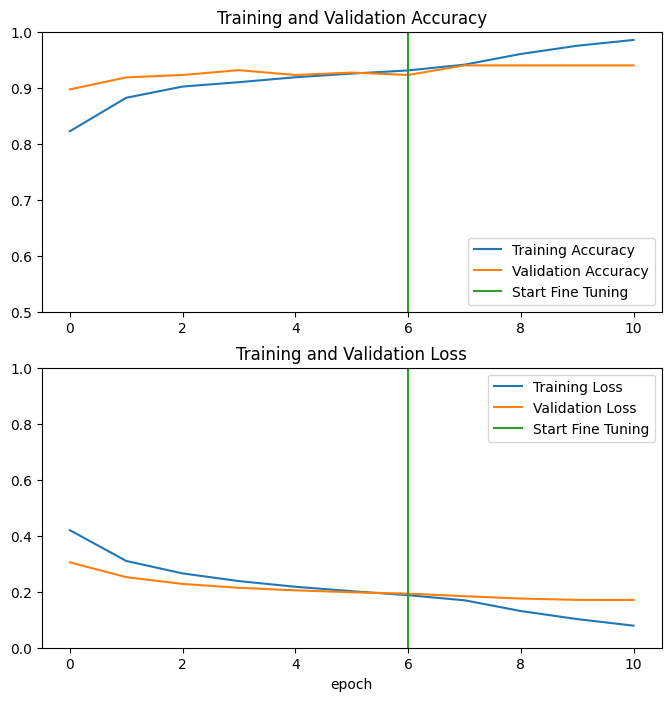

--- validation loss & accuracy with fine tune -------------------------------------------
8/8 [==============================] - 1s 94ms/step - loss: 0.1706 - accuracy: 0.9399
loss: 0.17
accuracy: 0.94
--- test loss & accuracy with fine tune -------------------------------------------
11/11 [==============================] - 9s 156ms/step - loss: 0.4004 - accuracy: 0.8269
loss: 0.40
accuracy: 0.83


In [ ]:
model_resnetV1 = model_training(ds_train = ds_train_resnet,
                                ds_val = ds_val_resnet,
                                base_model = resnet_model, 
                                base_model_name = base_model_name_resnet, 
                                initial_epochs = initial_epochs,
                                fine_tune_epochs=fine_tune_epochs,
                                version=1, 
                                finetune=True)

Model: "resnet"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 2048)              23587712  
                                                                 
 flatten (Flatten)           (None, 2048)              0         
                                                                 
 dense (Dense)               (None, 264)               540936    
                                                                 
 batch_normalization (BatchN  (None, 264)              1056      
 ormalization)                                                   
                                                                 
 dropout (Dropout)           (None, 264)               0         
                                                                 
 dense_1 (Dense)             (None, 64)                16960     
                                                            

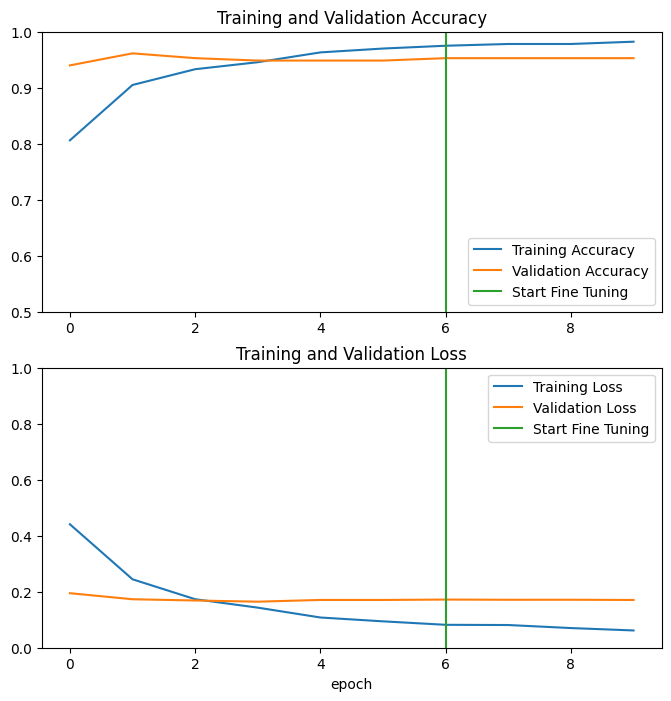

--- validation loss & accuracy with fine tune -------------------------------------------
8/8 [==============================] - 2s 120ms/step - loss: 0.1706 - accuracy: 0.9528
loss: 0.17
accuracy: 0.95
--- test loss & accuracy with fine tune -------------------------------------------
11/11 [==============================] - 8s 162ms/step - loss: 0.4224 - accuracy: 0.7970
loss: 0.42
accuracy: 0.80


In [ ]:
model_resnetV2 = model_training(ds_train = ds_train_resnet,
                                ds_val = ds_val_resnet,
                                base_model = resnet_model, 
                                base_model_name = base_model_name_resnet, 
                                version=2, 
                                initial_epochs = initial_epochs,
                                fine_tune_epochs=fine_tune_epochs,
                                finetune=True)

#### --> **6.3.3.1 ResNet50 training // key takeaways**

To compare the model progress during the training of the two different model head architectures, we compare the training curves. The training curves show how the accuracy and loss change over the epochs for both the training data and the validation data. By looking at the curves, we can evaluate how well the models fit the data, how fast they converge, and how generalizable they are to new data.


<table>
  <tr>
    <td>ResNet50 V1</td>
    <td>ResNet50 V2</td>
  </tr>
  <tr>
    <td><img src="https://drive.google.com/uc?export=view&id=1H0o2h7HfbrJDRhvRwbyS1g5DkBWL6-t6" width=400 height=420></td>
    <td><img src="https://drive.google.com/uc?export=view&id=1pR2rE4YjHzWO5cBQrgFHpMnZ-0Y4DFJY" width=400 height=420></td>
  </tr>
 </table>

- There is no big difference between V1 and V2 in terms of validation accuracy and loss. Both models achieve high scores from the beginning and improve slightly over time.
- V2 has a faster training accuracy improvement than V1, which may indicate that the additional layers help the model learn better from the training data.
- Fine-tuning does not seem to have a significant impact on the validation performance of either model. However, it affects the test performance differently. For V2, the test accuracy stays the same before and after fine-tuning (0.95), while for V1, it drops from 0.84 to 0.80.
- Fine-tuning also causes overfitting in V1, as the gap between the training and validation curves increases after fine-tuning. This suggests that V1 is too sensitive to the changes in the base model parameters and loses its generalization ability.
- Based on these results, we can conclude that fine-tuning is not necessary for this task and may even harm the model performance. We can also suggest that adding some extra layers to the model may help it learn faster and better from the training data, but it does not make a big difference in the validation performance.


### **6.3.4 Train VGG19**

Model: "vgg"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg19 (Functional)          (None, 512)               20024384  
                                                                 
 dense (Dense)               (None, 1)                 513       
                                                                 
Total params: 20,024,897
Trainable params: 513
Non-trainable params: 20,024,384
_________________________________________________________________
--- initial loss & accuracy -------------------------------------------
8/8 [==============================] - 2s 151ms/step - loss: 2.7558 - accuracy: 0.4506
initial loss: 2.76
initial accuracy: 0.45
--- fit model head ----------------------------------------------------
Epoch 1/7
100/100 [==============================] - 26s 243ms/step - loss: 1.6722 - accuracy: 0.4995 - val_loss: 1.1545 - val_accuracy: 0.5322
Epoch 2/7
100/100 [=========

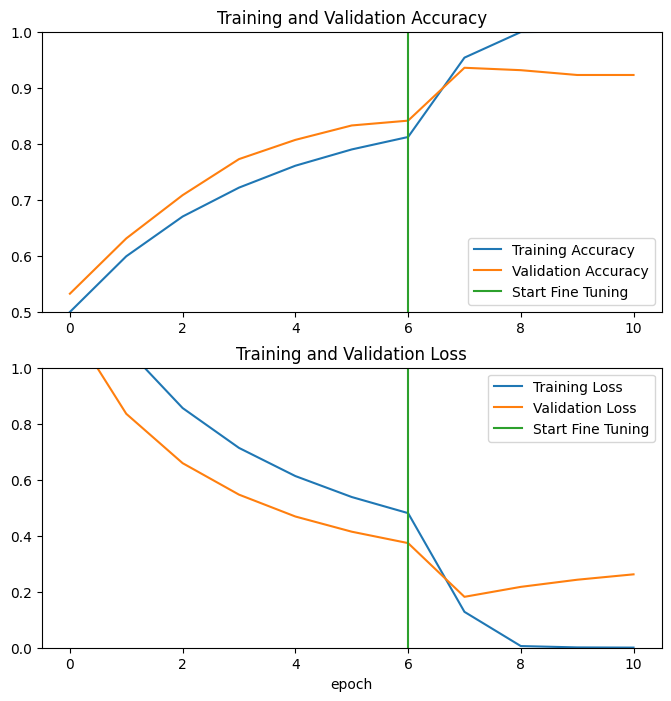

--- validation loss & accuracy with fine tune -------------------------------------------
8/8 [==============================] - 2s 147ms/step - loss: 0.2621 - accuracy: 0.9227
loss: 0.26
accuracy: 0.92
--- test loss & accuracy with fine tune -------------------------------------------
11/11 [==============================] - 8s 203ms/step - loss: 1.9453 - accuracy: 0.7403
loss: 1.95
accuracy: 0.74


In [ ]:
model_vgg_V1 = model_training(ds_train = ds_train_vgg,
                              ds_val = ds_val_vgg,
                              base_model = vgg_model, 
                              base_model_name = base_model_name_vgg, 
                              initial_epochs = initial_epochs,
                              fine_tune_epochs=fine_tune_epochs,
                              version=1, 
                              finetune=True)

Model: "vgg"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg19 (Functional)          (None, 512)               20024384  
                                                                 
 flatten (Flatten)           (None, 512)               0         
                                                                 
 dense (Dense)               (None, 264)               135432    
                                                                 
 batch_normalization (BatchN  (None, 264)              1056      
 ormalization)                                                   
                                                                 
 dropout (Dropout)           (None, 264)               0         
                                                                 
 dense_1 (Dense)             (None, 64)                16960     
                                                               

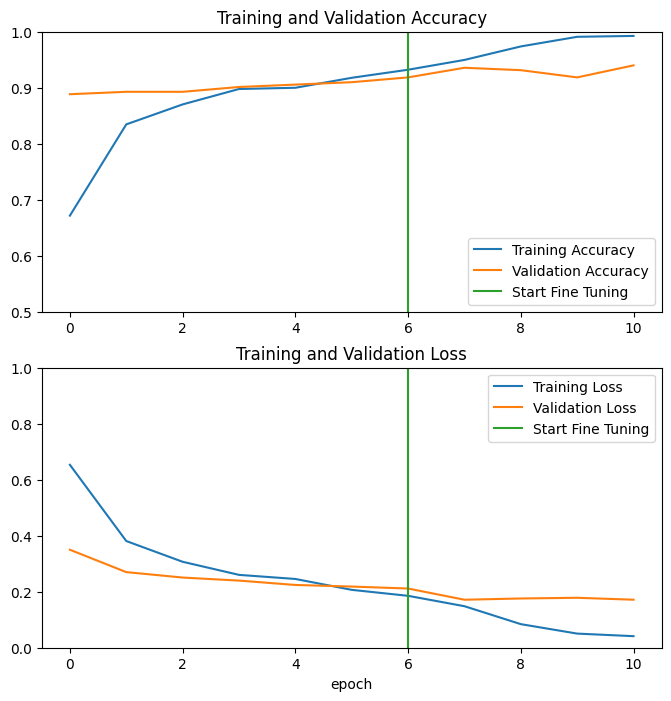

--- validation loss & accuracy with fine tune -------------------------------------------
8/8 [==============================] - 2s 158ms/step - loss: 0.1715 - accuracy: 0.9399
loss: 0.17
accuracy: 0.94
--- test loss & accuracy with fine tune -------------------------------------------
11/11 [==============================] - 8s 211ms/step - loss: 0.6601 - accuracy: 0.7493
loss: 0.66
accuracy: 0.75
vgg_version_2_0407-1226


In [ ]:
model_vgg_V2 = model_training(ds_train = ds_train_vgg,
                              ds_val = ds_val_vgg,
                              base_model = vgg_model, 
                              base_model_name = base_model_name_vgg,
                              initial_epochs = initial_epochs,
                              fine_tune_epochs=fine_tune_epochs,
                              version=2, 
                              finetune=True)

#### --> **6.3.4.1 VGG19 training // key takeaways**

To compare the model progress during the training of the two different model head architectures, we compare the training curves. The training curves show how the accuracy and loss change over the epochs for both the training data and the validation data. By looking at the curves, we can evaluate how well the models fit the data, how fast they converge, and how generalizable they are to new data.

<table>
  <tr>
    <td>VGG19 V1</td>
    <td>VGG19 V2</td>
  </tr>
  <tr>
    <td><img src="https://drive.google.com/uc?export=view&id=1aI2MpdaCM3DC3yjgsyQIPQA9UpC-VPln" width=400 height=420></td>
    <td><img src="https://drive.google.com/uc?export=view&id=1j4v0mU1qX-kGsYqnm6OSriy3djT8UgCb" width=400 height=420></td>
  </tr>
 </table>
In this paragraph, we will compare two versions of the VGG19 model: V1 and V2. V1 has a single dense layer at the end, while V2 has three dense layers. We will also contrast them with the ResNet50 model.

We can observe that V1 has a lower initial accuracy and a higher initial loss than V2 and ResNet50. This could be due to the difference in the model head approaches. V2 is closer to the original VGG19 model, which has three fully connected dense layers at the end.

However, V1 shows a good improvement in each epoch until the start of the fine tuning. The fine tuning works well for V1 and boosts its accuracy and reduces its loss. V2 also improves after the fine tuning step, but not as much as V1. V2 has a higher training accuracy than V1, but a lower validation accuracy. This could indicate some overfitting on the training data.

Therefore, we can conclude that both versions of the VGG19 model have their advantages and disadvantages. V1 is simpler and faster to train, but has a lower initial performance. V2 is more complex and slower to train, but has a higher initial performance. Fine tuning helps both models to achieve better results.



## **6.4 Evaluation of the model performance**

In this section, we will evaluate the performance of our trained model on the validation and test set of images. We will use two metrics to assess the model's accuracy and robustness: the ROC-AUC curve and the confusion matrix. Additionally, we will plot some examples of the images that were misclassified by the model and try to identify any visual patterns that might explain the errors. To perform this evaluation, we will use the following functions:

- `load_images`: This function takes the path to the test images folder and returns two arrays: one containing the image data and one containing the labels.
- `get_false_data`: This function takes the image array, the model predictions and the true labels and returns a list: containing the image data, the predictions and the labels of the misclassified images.
- `plot_images`: This function takes the output of `get_false_data` and plots a sample of them in a grid.
- `plot_auc`: This function takes the model predictions and the true labels and calculates the false positive rate (FPR), true positive rate (TPR) and area under the curve (AUC) values. It then plots the ROC-AUC curve and displays the AUC score. We calculate as well the Youden index [9] to see to optimal threshold. 
- `plot_cm`: This function takes the model predictions and the true labels and creates a confusion matrix. It then plots the matrix as a heatmap with annotations.

In [ ]:
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.metrics import confusion_matrix
import seaborn as sns


def load_images(folder):
    
    imgsx = []
    target = 1  #cracked = 1, normal = 0
    labels = []
    for i in os.listdir(folder):
        subdir = os.path.join(folder, i)
        for j in os.listdir(subdir):
            img_dir = os.path.join(subdir,j)
            
            img = cv2.imread(img_dir)
            img = cv2.resize(img, (224,224))
            imgsx.append(img)
            labels.append(target)

        target -= 1
    
    imgsx = np.array(imgsx)
    labels = np.array(labels)
    
    return imgsx, labels



def get_false_data(test_data, test_labels, predictions):

  false_data = []
  for i in range(len(test_labels)):
    x = []
    if test_labels[i] != predictions[i]:
      x.append(test_data[i])
      x.append(test_labels[i])
      x.append(predictions[i])
      false_data.append(x)

  return false_data




def plot_images(data):
    plt.figure(figsize=(22,8))
    for i in range(10):
        axs = plt.subplot(2,5, i+1)
        idx = np.random.randint(0, len(data))
        plt.imshow(data[idx][0], cmap = 'gray')
        plt.axis('on')
        axs.set_xticklabels([])
        axs.set_yticklabels([])
        axs.title.set_text('label: ' + str(data[idx][1]) + '  prediction: ' + str(data[idx][2]))
        plt.subplots_adjust(wspace=None, hspace=None)


def plot_auc(predictions, test_labels, optimal_threshold=False):
  
  fpr, tpr, thresholds = roc_curve(predictions, test_labels)
  auc = roc_auc_score(predictions, test_labels)
  if optimal_threshold:
    optimal_idx = np.argmax(tpr - fpr)
    optimal_threshold = thresholds[optimal_idx]
    print("Threshold value is:", optimal_threshold)

  fig, ax = plt.subplots()
  ax.plot(fpr, tpr)
  ax.plot([0, 1], [0, 1], color='navy', linestyle='--', label='random')
  plt.title(f'AUC: {auc}')
  ax.set_xlabel('False positive rate')
  ax.set_ylabel('True positive rate')



def plot_cm(predictions, labels, p, base_model_name, version):
  cm = confusion_matrix(labels, predictions > p)
  plt.figure(figsize=(5,5))
  sns.heatmap(cm, annot=True, fmt="d")
  plt.title(f'{base_model_name} V_{version} Confusion matrix @{p}')
  plt.ylabel('Actual label')
  plt.xlabel('Predicted label')


### **6.4.1 Parameter settings for evaluation**

To evaluate, we need to load the model that we saved earlier. Then, we need to set the parameter p, which is the threshold for the class membership. Our models have a sigmoid activation function in the last dense layer, which outputs the probabilities of belonging to one of the two classes. We can adjust this threshold based on the ROC-AUC curve and the confusion matrix that we computed on the validation data.


In [ ]:
evaluation_model_vggV1 = tf.keras.models.load_model('/content/drive/MyDrive/DeepLearningProject/03 Project/tranfer_models/vgg_version_1_0407-1055.h5')
evaluation_model_vggV2 = tf.keras.models.load_model('/content/drive/MyDrive/DeepLearningProject/03 Project/tranfer_models/vgg_version_2_0407-1101.h5')
evaluation_model_resnetV1 = tf.keras.models.load_model('/content/drive/MyDrive/DeepLearningProject/03 Project/tranfer_models/resnet_version_1_0407-1014.h5')
evaluation_model_resnetV2 = tf.keras.models.load_model('/content/drive/MyDrive/DeepLearningProject/03 Project/tranfer_models/resnet_version_2_0407-1037.h5')

In [ ]:
initial_p = 0.5

In [ ]:
val_data_raw, val_labels = load_images(path_aug+main_folder_aug+val_folder_aug)

In [ ]:
val_data_vgg, val_labels = preprocess_vgg(val_data_raw, val_labels)
val_data_resnet, val_labels = preprocess_vgg(val_data_raw, val_labels)

### **6.4.2 Evaluation on validation Data**

#### **6.4.2.1 VGG19 - Version 1** // preprosess, basemodel, pooling, output

In [ ]:
predictions_val = evaluation_model_vggV1.predict(val_data_vgg)

8/8 [==============================] - 186s 23s/step


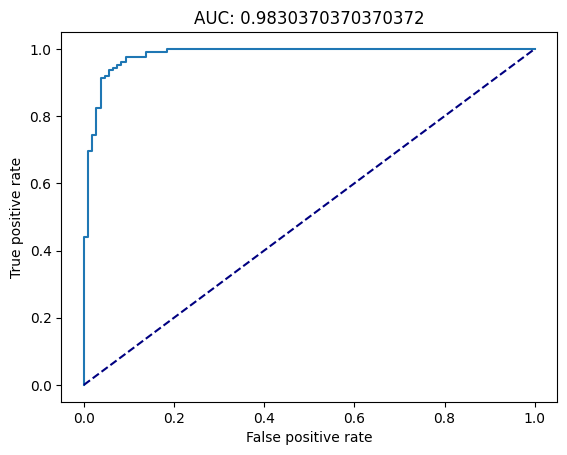

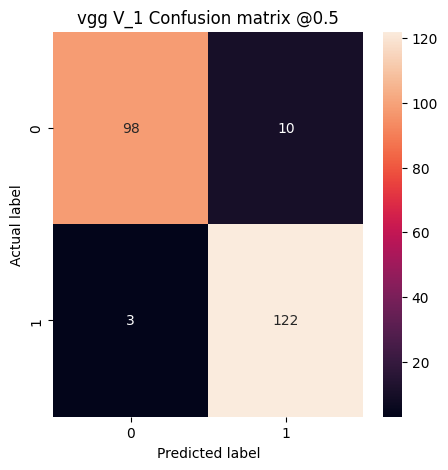

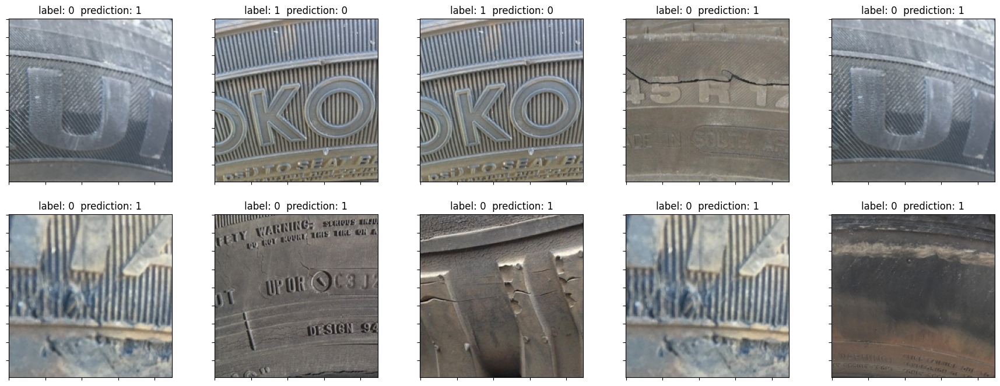

In [ ]:
prediction_classes_val = np.concatenate((predictions_val > initial_p).astype("int32"), axis=0 )
false_data = get_false_data(val_data_raw, val_labels, prediction_classes_val)

plot_auc(val_labels, predictions_val)
plot_cm(prediction_classes_val, val_labels , initial_p, base_model_name_vgg, version = 1)
plot_images(false_data)

#### **6.4.2.2 VGG19 - Version 2** // preprosess, basemodel, pooling, **dense**, output

In [ ]:
predictions_val = evaluation_model_vggV2.predict(val_data_vgg)

8/8 [==============================] - 167s 21s/step


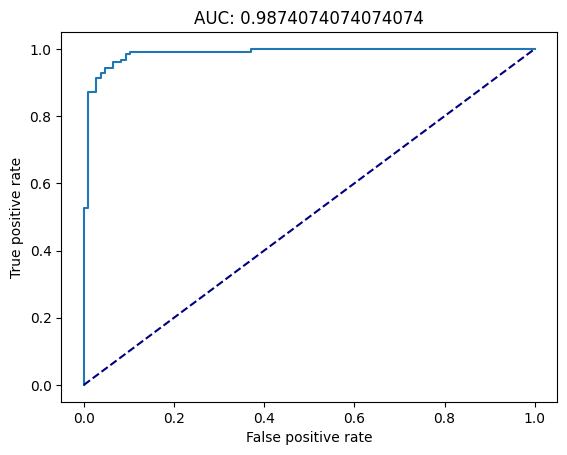

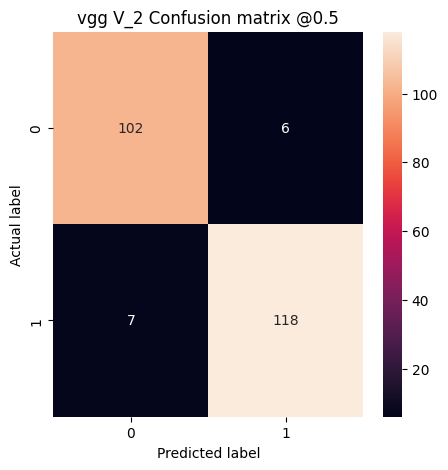

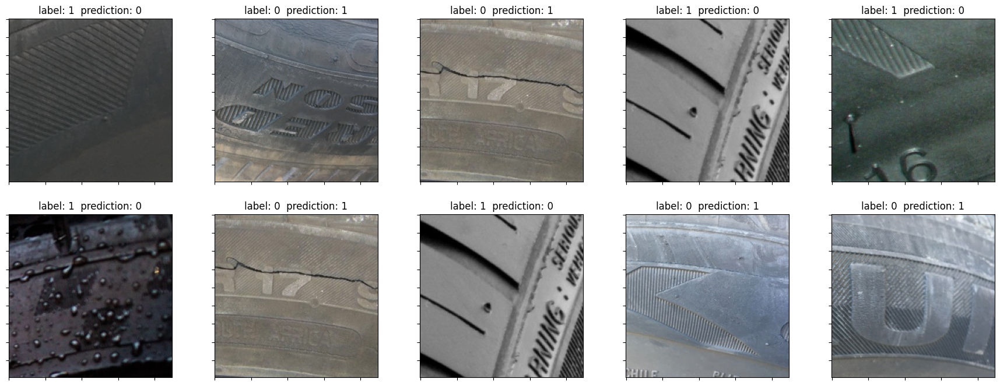

In [ ]:
prediction_classes_val = np.concatenate((predictions_val > initial_p).astype("int32"), axis=0 )
false_data = get_false_data(val_data_raw, val_labels, prediction_classes_val)

plot_auc(val_labels, predictions_val)
plot_cm(prediction_classes_val, val_labels , initial_p, base_model_name_vgg, version = 2)
plot_images(false_data)


#### **6.4.2.3 ResNet50 - Version 1** // preprosess, basemodel, pooling, output

In [ ]:
predictions_val = evaluation_model_resnetV1.predict(val_data_resnet)

8/8 [==============================] - 46s 6s/step


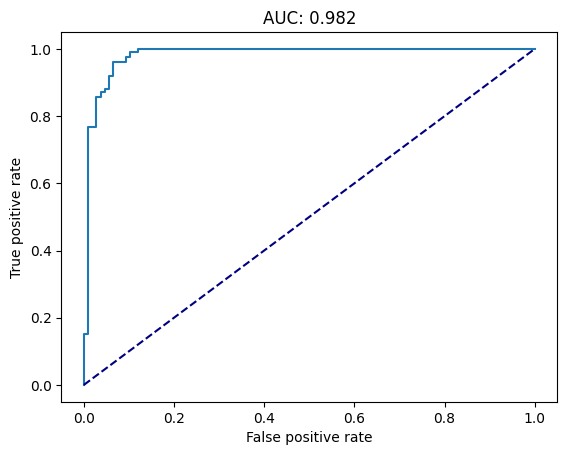

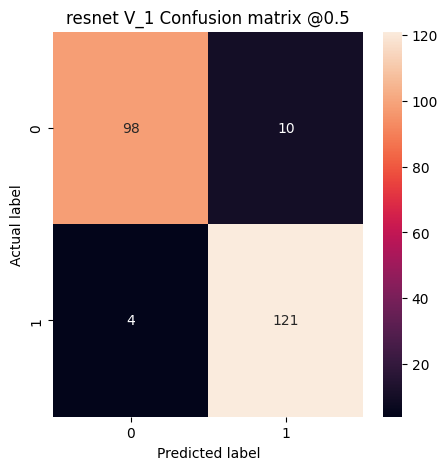

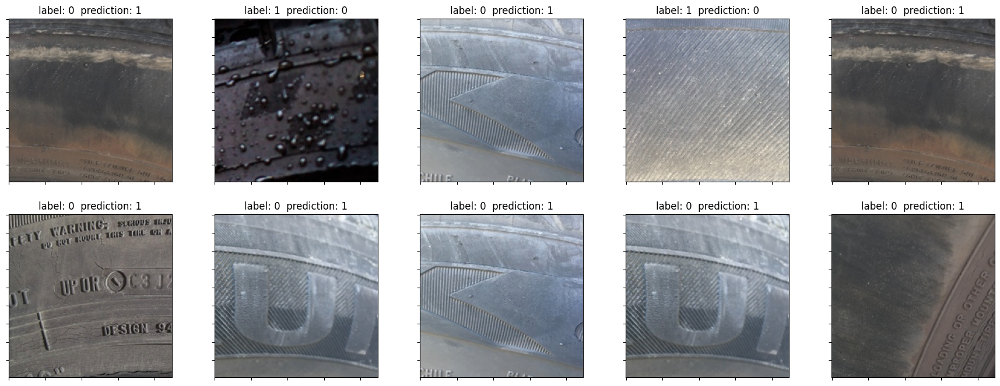

In [ ]:
prediction_classes_val = np.concatenate((predictions_val > initial_p).astype("int32"), axis=0 )
false_data = get_false_data(val_data_raw, val_labels, prediction_classes_val)

plot_auc(val_labels, predictions_val)
plot_cm(prediction_classes_val, val_labels , initial_p, base_model_name_resnet, version = 1)
plot_images(false_data)


#### **6.4.2.4 ResNet50 - Version 2** // preprosess, basemodel, pooling, **dense**, output

In [ ]:
predictions_val = evaluation_model_resnetV2.predict(val_data_resnet)

8/8 [==============================] - 47s 5s/step


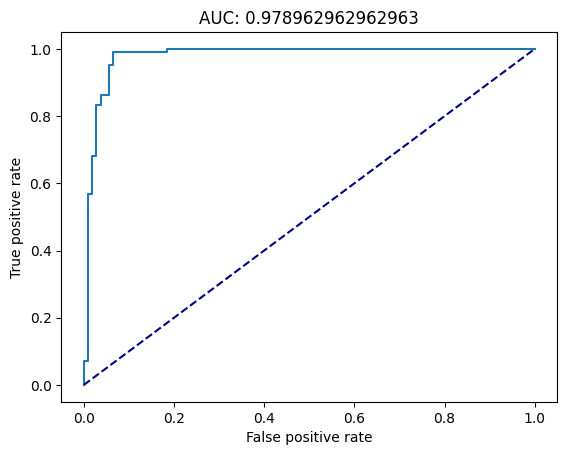

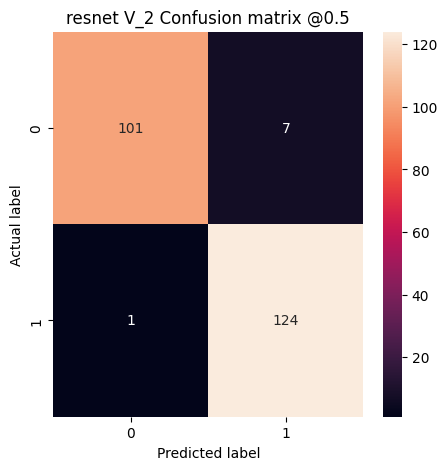

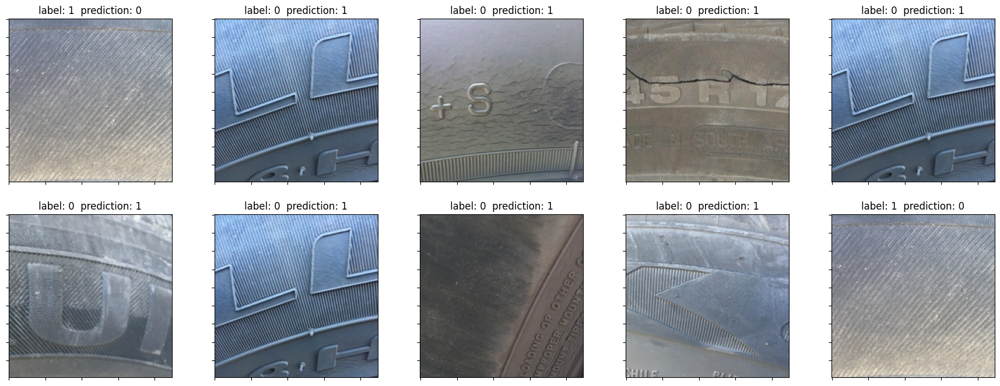

In [ ]:
prediction_classes_val = np.concatenate((predictions_val > initial_p).astype("int32"), axis=0 )
false_data = get_false_data(val_data_raw, val_labels, prediction_classes_val)

plot_auc(val_labels, predictions_val)
plot_cm(prediction_classes_val, val_labels , initial_p, base_model_name_resnet, version = 2)
plot_images(false_data)


#### --> **6.4.2.5 Evaluation on validation data // key takeaways**

 In this section, we will discuss how we evaluated the different models that we trained for the task of tire defect detection. We used different metrics to measure the performance of our models and to compare them with each other. Our main instrument is the confusion matrix, which shows how many images were correctly or incorrectly classified by each model. Next to it, we also checked the AUC ROC score, which is a measure of how well the model can distinguish between defective and non-defective tires. We also plotted some samples of the wrong classified images to see if there is a visual pattern that explains why the model failed.

The following figure shows the confusion matrices of the four models that we experimented with: VGG19 Version 1, VGG19 Version 2, ResNet50 Version 1, and ResNet50 Version 2. All of them were applied to the validation data, which consists of 233 images that were not used for training.


<table>
  <tr>
    <td>VGG19</td>
    <td> </td>
    <td>ResNet50</td>
    <td> </td>
  </tr>
  <tr>
    <td><img src="https://drive.google.com/uc?export=view&id=1W2NnRCQIgy27R7z0HN0Tg1x52dQHoEGu" width=250 height=260></td>
    <td><img src="https://drive.google.com/uc?export=view&id=1snErwd6pUC9SjFPLl0o5N2RL_k6WIFxU" width=250 height=260></td>
    <td><img src="https://drive.google.com/uc?export=view&id=14wFdWSxH2TG_-dLSOeIcWjUsKd6q6H43" width=250 height=260></td>
    <td><img src="https://drive.google.com/uc?export=view&id=1wRR77UUUy2TZoRHo3y4AaAsm7Lk32oRm" width=250 height=260></td>
  </tr>
 </table>


The first thing we can see is that all models perform quite well. There are only slight differences between the distribution in the CM fields. The accuracy of all models is above 90%, which means that they correctly classified more than 90% of the images. 

The used threshold of 0.5 seems to be good. This means that we classified an image as defective if the model output a probability higher than 0.5, and as non-defective otherwise. If we changed this threshold, we might get different results in terms of accuracy, recall and precision. But in this case it is not needed.

To get a feeling for the wrong classified images, you can find underneath the sample output of ResNet50 Version 1. Due to the issue that all models perform similarly, we can use also every other sample image output.

What we can assume that the model has problems with dirt and water on the tires, as well as strong cracks which are going over the whole image. Besides, there is no visual pattern detectable. It might depend on other factors such as lighting or angle.



<table>
  <tr>
    <td>Samples of wrong classified images (ResNet50 Version 1) // 0 = Cracked   1 = Normal </td>
  </tr>
  <tr>
    <td><img src="https://drive.google.com/uc?export=view&id=1RC78eSGbvwjtkZZh9-3sKvwpk1627syo" width=1000 height=400></td>
  </tr>
 </table>


### **6.4.3 Evaluation on test data**

In [ ]:
test_data_raw, test_labels = load_images(path+main_folder+testing_folder)

In [ ]:
test_data_vgg, test_labels = preprocess_vgg(test_data_raw, test_labels)
test_data_resnet, test_labels = preprocess_vgg(test_data_raw, test_labels)

#### **6.4.3.1 VGG19 - Version 1** // preprosess, basemodel, pooling, output

In [ ]:
predictions_test_vgg_v1 = evaluation_model_vggV1.predict(test_data_vgg)

11/11 [==============================] - 273s 25s/step


Threshold value is: 0.91514593


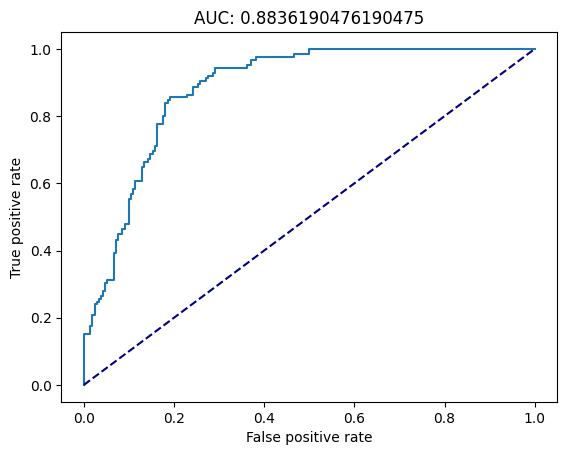

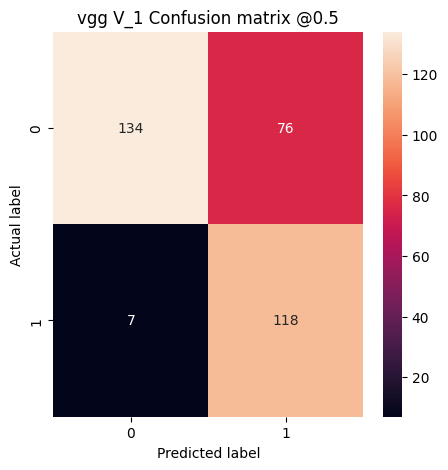

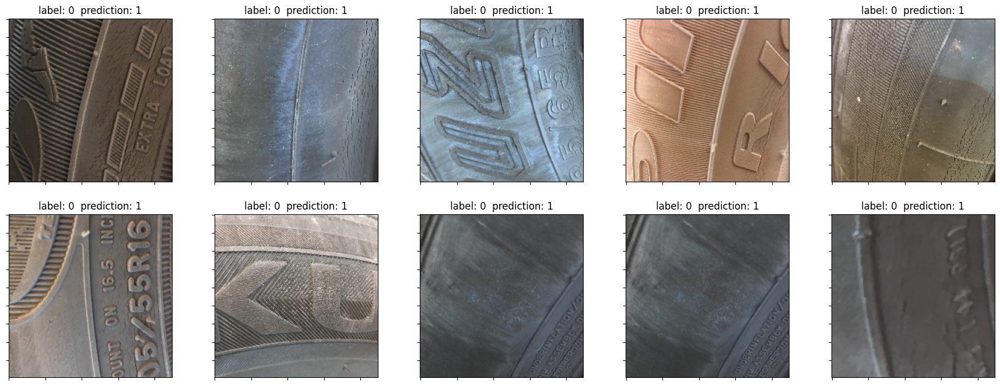

In [ ]:
prediction_classes = np.concatenate((predictions_test_vgg_v1 > initial_p).astype("int32"), axis=0 )
false_data = get_false_data(test_data_raw, test_labels, prediction_classes)

plot_auc(test_labels, predictions_test_vgg_v1, optimal_threshold=True)
plot_cm(predictions_test_vgg_v1, test_labels ,  initial_p, base_model_name_vgg, version = 1)
plot_images(false_data)


#### **6.4.3.2 VGG19 - Version 2** // preprosess, basemodel, pooling, **dense**, output

In [ ]:
predictions_test_vgg_v2 = evaluation_model_vggV2.predict(test_data_vgg)

11/11 [==============================] - 280s 26s/step


In [ ]:
prediction_classes = np.concatenate((predictions_test_vgg_v2 > initial_p).astype("int32"), axis=0 )
false_data = get_false_data(test_data_raw, test_labels, prediction_classes)

plot_auc(test_labels, predictions_test_vgg_v2, optimal_threshold=True)
plot_cm(predictions_test_vgg_v2, test_labels ,  initial_p, base_model_name_vgg, version = 2)
plot_images(false_data)

Output hidden; open in https://colab.research.google.com to view.

#### **6.4.3.3 ResNet50 - Version 1** // preprosess, basemodel, pooling, output

In [ ]:
predictions_test_resnet_v1 = evaluation_model_resnetV1.predict(test_data_resnet)

11/11 [==============================] - 105s 9s/step


Threshold value is: 0.61428475


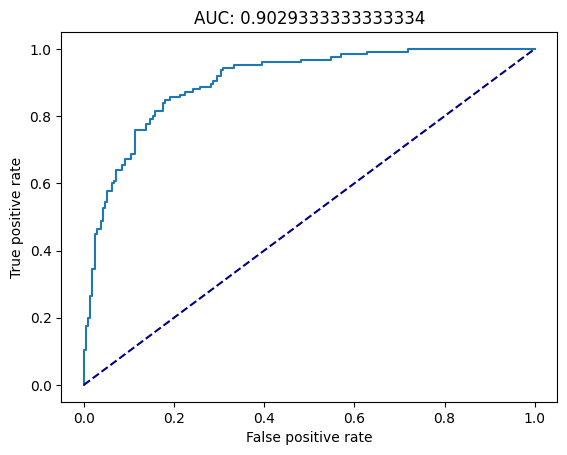

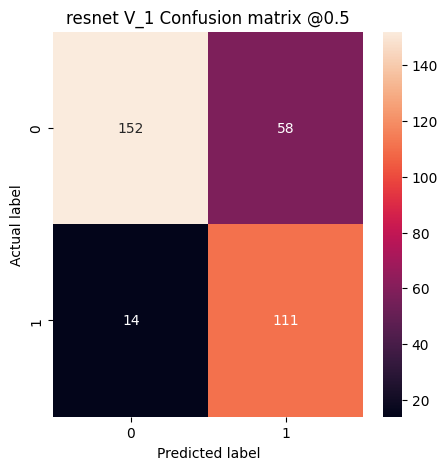

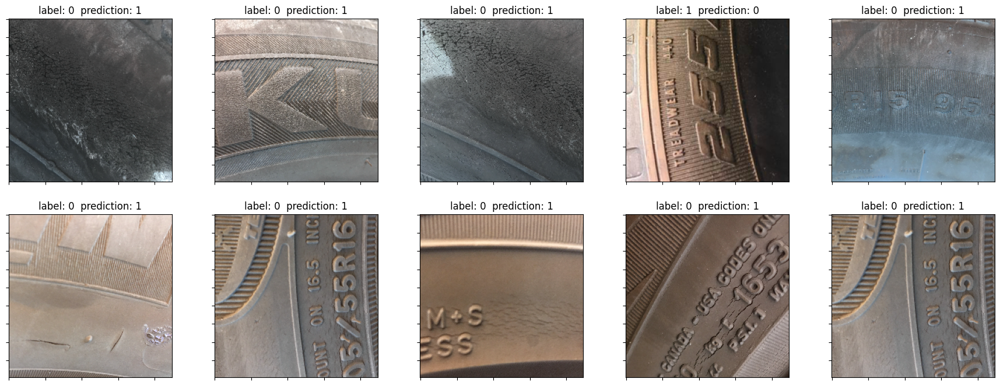

In [ ]:
prediction_classes = np.concatenate((predictions_test_resnet_v1 > initial_p).astype("int32"), axis=0 )
false_data = get_false_data(test_data_raw, test_labels, prediction_classes)

plot_auc(test_labels, predictions_test_resnet_v1, optimal_threshold=True)
plot_cm(predictions_test_resnet_v1, test_labels , initial_p, base_model_name_resnet, version = 1)
plot_images(false_data)

#### **6.4.3.4 ResNet50 - Version 2** // preprosess, basemodel, pooling, **dense**, output

In [ ]:
predictions_test_resnet_v2 = evaluation_model_resnetV2.predict(test_data_resnet)

11/11 [==============================] - 93s 8s/step


Threshold value is: 0.6454814


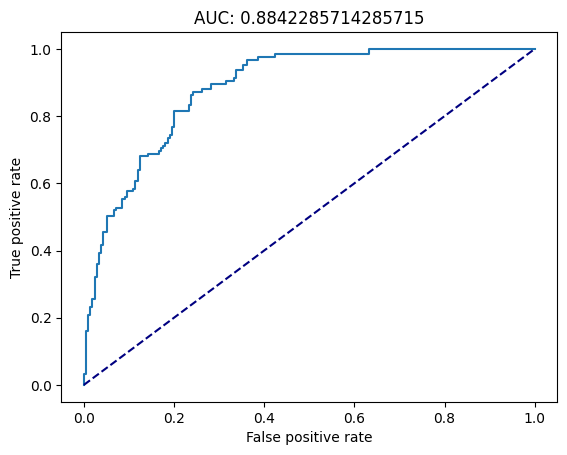

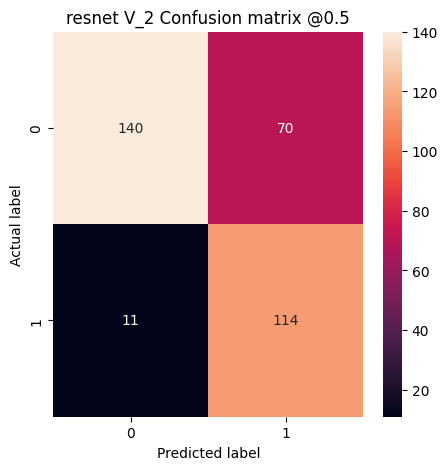

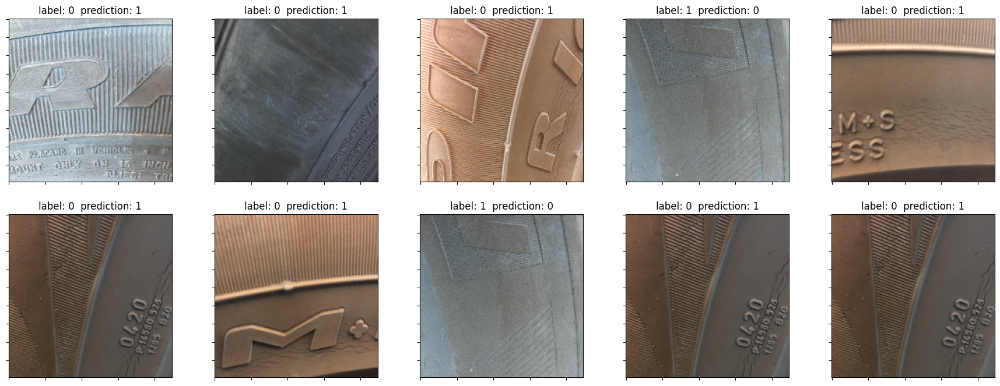

In [ ]:
prediction_classes = np.concatenate((predictions_test_resnet_v2 > initial_p).astype("int32"), axis=0 )
false_data = get_false_data(test_data_raw, test_labels, prediction_classes)

plot_auc(test_labels, predictions_test_resnet_v2, optimal_threshold=True)
plot_cm(predictions_test_resnet_v2, test_labels , initial_p, base_model_name_resnet, version = 2)
plot_images(false_data)

#### --> **6.4.3.5 Evaluation on test data // key takeaways**

In this section, we evaluate the model on unseen test data. Therefore, we use the same instruments as for the evaluation of the validation data: the confusion matrix, the AUC-ROC curve, and some samples of the wrongly classified images.

The following figure shows the confusion matrices of the four models that we experimented with: VGG19 Version 1, VGG19 Version 2, ResNet50 Version 1, and ResNet50 Version 2. All of them were applied to the test data, which consists of 233 images that were not used for training.


<table>
  <tr>
    <td>VGG19</td>
    <td> </td>
    <td>ResNet50</td>
    <td> </td>
  </tr>
  <tr>
    <td><img src="https://drive.google.com/uc?export=view&id=1rUmex0S1AstOZzTAe6YjhyCYDRG-4cG4" width=250 height=260></td>
    <td><img src="https://drive.google.com/uc?export=view&id=1hboG3Nh623MB23rNpWzAXhDi3R5xb9u2" width=250 height=260></td>
    <td><img src="https://drive.google.com/uc?export=view&id=14Id_7eccV7RKhPcibEwyW_3QW3P2YprT" width=250 height=260></td>
    <td><img src="https://drive.google.com/uc?export=view&id=1JOjfbnO6ZHr616sPVOnCfXmtNKjem5HV" width=250 height=260></td>
  </tr>
 </table>

Contrary to the confusion matrices of the validation data, we can see bigger differences between the models. But let's first have a view on the confusion matrices all together. We can see directly that the distribution is imbalanced. In all CMs, we have clearly more damaged tires which were classified as normal tires than normal tires witch were classified as damaged tires. 

We can also see that the model heads have different influence on the model. For the VGG19 base model, the version 2 model head works better. While for the ResNet50 model, the base model with a single output layer works better. This could be explained with the model deepness and the architecture. ResNet50 is "*8x deeper than VGG nets but still having lower complexity than VGG19 nets" (HeDeep, 2015) [6]*. But at the end, ResNet has a single dense layer with the number of classes as output layer. In our ResNet Version 1, we replace this output layer. Contrary to ResNet, VGG19 has three FC layers which we cut off. In our Version 1, we replace these three layers with a single output dense layer. In version 2, we replace it with three dense layers.

**Regarding the distribution, we may have to readjust our threshold**. The 0.5 threshold worked well for the validation data, but on test data it looks quite different. In the next step, we try to readjust the threshold custom for every model.

In the AUC-ROC curves, we see similar shapes between the different models and they are all shaped well. Meaning there is a good separability between the classes. We can see that the curves for VGG V2 and ResNet V1 look more smooth.

<table>  
  <tr>
    <td>VGG19</td>
    <td> </td>
    <td>ResNet50</td>
    <td> </td>
  </tr>
  <tr>
  <tr>
    <td><img src="https://drive.google.com/uc?export=view&id=1lnN7I1DUd3-MSffoFSGx1Qmw6lMepTP0" width=250 height=210></td>
    <td><img src="https://drive.google.com/uc?export=view&id=1Za79MfYDoezpQlqe7bPijqqjgzNhsmxW" width=250 height=210></td>
    <td><img src="https://drive.google.com/uc?export=view&id=1cfcatENMn4d8T6T_pmU6NtbLo5zDSe5y" width=250 height=210></td>
    <td><img src="https://drive.google.com/uc?export=view&id=1jdWHsR212X787sPLy9X8psybs6aOVabv" width=250 height=210></td>
  </tr>
 </table>

We analyzed some of the misclassified images from the test set using the ResNet V1 model. We found similar issues as in the validation data, such as dirt on the tires. We also noticed that the model struggled to detect cracks between the letters on the tires. Moreover, we observed more images with warm/orange lighting conditions. This suggests that the training data did not have enough representation of this lighting scenario.

<table>
  <tr>
    <td>Samples of wrong classified images (ResNet50 Version 1) // 0 = Cracked   1 = Normal </td>
  </tr>
  <tr>
    <td><img src="https://drive.google.com/uc?export=view&id=1wVGrZxrAqD7FDDzoF8QaAM7hhWytPeNr" width=1000 height=400></td>
  </tr>
 </table>




### **6.4.4 Readjusting the threshold**

The optimal cut off point is the threshold that maximizes the true positive rate (tpr) and minimizes the false positive rate (fpr) of a binary classifier. This means that the classifier correctly identifies most of the positive cases and rejects most of the negative cases. One way to find the optimal cut off point is to plot the tpr against the fpr for different thresholds and look for the point where tpr - (1-fpr) is zero or near to zero. This point is also known as the Youden's index or the point closest to the top left corner of the ROC curve. (see Fluss R, Faraggi D, Reiser B, 2005) [9]


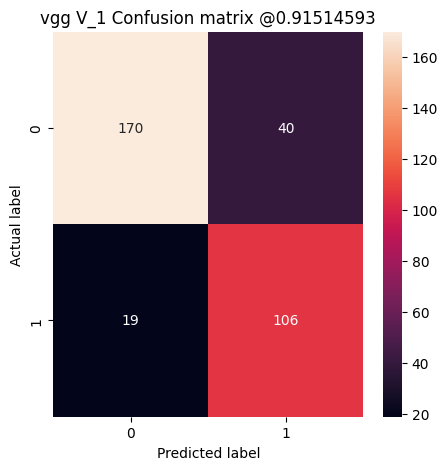

In [ ]:
# VGG19 V1

adjusted_p = 0.91514593

prediction_classes = np.concatenate((predictions_test_vgg_v1 > adjusted_p).astype("int32"), axis=0 )
false_data = get_false_data(test_data_raw, test_labels, prediction_classes)
plot_cm(predictions_test_vgg_v1, test_labels ,  adjusted_p, base_model_name_vgg, version = 1)


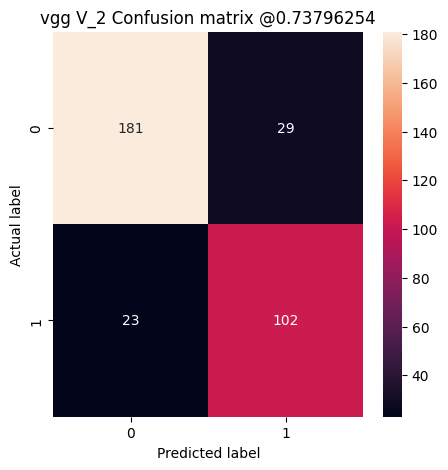

In [ ]:
# VGG19 V2

adjusted_p = 0.73796254

prediction_classes = np.concatenate((predictions_test_vgg_v2 > adjusted_p).astype("int32"), axis=0 )
false_data = get_false_data(test_data_raw, test_labels, prediction_classes)
plot_cm(predictions_test_vgg_v2, test_labels ,  adjusted_p, base_model_name_vgg, version = 2)

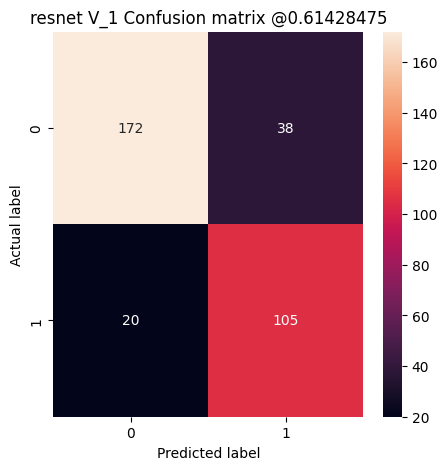

In [ ]:
# ResNet50 V1

adjusted_p = 0.61428475

prediction_classes = np.concatenate((predictions_test_resnet_v1 > adjusted_p).astype("int32"), axis=0 )
false_data = get_false_data(test_data_raw, test_labels, prediction_classes)
plot_cm(predictions_test_resnet_v1, test_labels , adjusted_p, base_model_name_resnet, version = 1)

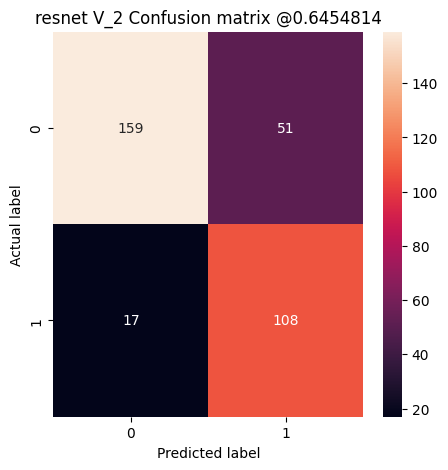

In [ ]:
# ResNet50 V2

adjusted_p = 0.6454814

prediction_classes = np.concatenate((predictions_test_resnet_v2 > adjusted_p).astype("int32"), axis=0 )
false_data = get_false_data(test_data_raw, test_labels, prediction_classes)
plot_cm(predictions_test_resnet_v2, test_labels , adjusted_p, base_model_name_resnet, version = 2)

# **6.5 Conclution**

In this project, we used different deep learning models to classify images of concrete surfaces into cracked or not cracked. We evaluated the models based on their accuracy, loss and auc score. We also used confusion matrixes to visualize the performance of the models.

By readjusting the thresholds, the confusion matrixes could be adapted to the distribution of the test data. If the model is to be used in the real world, however, one must keep a close eye on it. Such a readjustment only works if the test data represent the real world data. Otherwise, this can lead to distortion and the model delivers poor results. In our case we assume that the test data reflect the real world data.

**After some comparison and many steps, the VGG model in version 2 concludes best. However, the other models are on a similar level.**

As a further step, K Fold could be implemented, which would provide more training data. This could improve the performance and robustness of the models. K Fold is a technique that splits the data into k subsets and uses one subset as validation data and the rest as training data. This process is repeated k times and the average score is calculated.

In addition, the models could be trained with images of cracks of other objects for better generalization. This could help the models to recognize cracks in different contexts and materials. For example, we could use images of cracks in walls or roads.

Furthermore, one could either try to bring more images in different light settings into the training data or to change the light settings by augmentation. This could help the models to deal with different illumination conditions and enhance their performance. 